# Model for joint multispecies distributions
Using real data. For more infromation on how these data were obtain go to: http://panthera:8888/notebooks/external_plugins/paper3code/%5BD.E%5DCell%20Extractor.ipynb 
<img src="sketch_model_DASE.png" width="400" height="400">

## Load libraries

In [1]:
import pandas as pd
import numpy as np

import pystan
import statsmodels.api as stmod
import scipy as sp


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
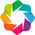

In [9]:
%matplotlib inline
import sys
sys.path.append('/apps')
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
## Use the ggplot style
plt.style.use('ggplot')
## Now, let's use pystan
import geopandas as gpd
import pystan
import patsy 
#import utilities.data_extraction as de
## Use the ggplot style
plt.style.use('ggplot')
import geoviews as gv
import geoviews.feature as gf
from cartopy import crs
#gv.extension('bokeh','matplotlib')
gv.extension('bokeh')
plt.rcParams['figure.figsize'] = [10, 10]


## Data Needed
Change working directory to a hierarchy such that the folder 'data' is a sibling node

In [12]:

cd ../external_plugins/JSDM4POD/

[Errno 2] No such file or directory: '../external_plugins/JSDM4POD/'
/main/app/external_plugins/JSDM4POD


In [13]:
## Geometry file
datafile = "data/multispecies_data_puebla_p9_geometry.json"
## Readfile
data_w_islands = gpd.read_file(datafile,na_values='N.A.')
data_w_islands = data_w_islands.replace('N.A.', np.nan)
data_w_islands.set_index(['cell_ids','level'],inplace=True)
#gg.plot(edgecolor='black')


<AxesSubplot:>

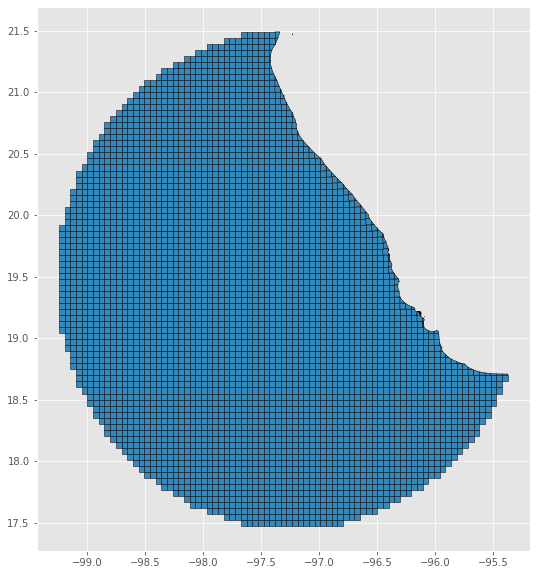

In [14]:
data_w_islands.xs(1,level=1).plot(edgecolor='black')

In [17]:
## Read the adjacency matrix. 
## This was obtained from biospytial. 
## In Biospytial the map above and this matrix are attributes of the same class.
mat_filename = "data/training_data_sample_puebla_p9_abies_pinophyta_adjmat.npy"
M = np.load(file=mat_filename).astype('float')

## Read nodes from the graph file
## New thing starting here, reset kernell and start here
#file_ = "/outputs/training_data_sample_puebla_p9_graph_neighbourlist.csv"
#raw_nodes = pd.read_csv(file_)

#plt.imshow(M[:100,:100])

### Data preprocessing , Remove islands


In [18]:
## Calculate number of neighbours
D = np.sum(M,axis=1).astype('float')

## We need to remove polygons with zero neighbours. 
## Failure to do so would have repercusions in the Positive definiteness of Covariance Matrix.
## Remove islands
idx_islands = np.where(D == 0 )
## 
nD = np.delete(D,idx_islands,axis=0)
NM = np.delete(M,idx_islands,axis=0)
NM = np.delete(NM,idx_islands,axis=1)
## Convert to ND into a diagonal matrix
ND = np.diag(nD)

## convert index in matrix to index in cellids
island_cell_id = data_w_islands.index.levels[0][idx_islands][0]

## remove island according to the index of the cell_ids
data = data_w_islands.drop(island_cell_id)

/opt/conda/envs/biospytial3/lib/python3.8/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [19]:
## this converts the columns to float
data_d = data[data.columns[2:12]].astype(float)


In [20]:
## Ok, Im very tired and so I will replace the nas with the mean corresponding to the column

In [21]:
means = data_d.mean()
for column in data_d:
    data_d[column].replace(np.nan,means[column],inplace=True)

In [22]:
data_d.columns

Index(['Dist.to.road_m', 'Elevation_m', 'MaxTemp_m', 'MeanTemp_m', 'MinTemp_m',
       'Population_m', 'Precipitation_m', 'SolarRadiation_m', 'VaporPres_m',
       'WindSp_m'],
      dtype='object')

In [23]:
data_d.columns[1:]

Index(['Elevation_m', 'MaxTemp_m', 'MeanTemp_m', 'MinTemp_m', 'Population_m',
       'Precipitation_m', 'SolarRadiation_m', 'VaporPres_m', 'WindSp_m'],
      dtype='object')

In [24]:
data_d.columns = ['distance_to_road'] + list(data_d.columns[1:])

In [25]:
## Add an intercept to each process.
#### This is a work around and should be avoided in production.
formula = '~ Elevation_m + Precipitation_m +  distance_to_road + Population_m'
X1 = patsy.dmatrix(formula,data=data_d,return_type='dataframe',NA_action="drop")
X2 = patsy.dmatrix(formula,data=data_d,return_type='dataframe',NA_action="drop")
X1.drop(['distance_to_road','Population_m'],axis=1,inplace=True)
X2.drop(['Elevation_m','Precipitation_m'],axis=1,inplace=True)
X = pd.concat([X1,X2],axis=1)

# Fitting the model

In [26]:
import models

In [23]:
reload(models)

<module 'external_plugins.paper3code.models' from '/apps/external_plugins/paper3code/models.py'>

In [27]:
## Load model and compile 
multispecies_model = models.multispeciesCARModel_stationaryBernoulli()
%time multispecies_model = pystan.StanModel(model_code=multispecies_model)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_5ea4edceb6f41caad64880d7a1a99598 NOW.


CPU times: user 1.41 s, sys: 71.6 ms, total: 1.48 s
Wall time: 1min 18s


In [32]:
levels = data.index.get_level_values(1)
MaxLevels = 6
## seems that N_edges is defined differently here.
N_edges = int(np.sum(NM)/2.0)


N = X.shape[0]
K = X.shape[1] 
J = MaxLevels
adjacency_matrix = NM  # Removed islands from M
## number of levels to model

## It needs here a precheck of the dimmensions of the covariates
n_eco_covs = 3
n_samp_covs = 3

data_multilevel_CAR = {'N' : N,
        'N_ecological_covariates' : n_eco_covs,
        'N_sample_covariates' : n_samp_covs,
        'J': J,                  
        'N_edges' : N_edges,
        'N_areas' : int(X.shape[0]/J),   
        'level': levels, # Stan counts starting at 1
        'W' : adjacency_matrix,            
        #'y': simulation['logit_p_sim'].values,
        #'y': simulation['q'].values,
        'y': data.Y.values.astype('int'),              
        #'y': yy.simulated.values.flatten().astype('float'),
        'x': X,
       }


In [33]:
data.groupby(by='taxon').first()

,Y,Dist.to.road_m,Elevation_m,MaxTemp_m,MeanTemp_m,MinTemp_m,Population_m,Precipitation_m,SolarRadiation_m,VaporPres_m,WindSp_m,Longitude,Latitude,geometry
taxon,,,,,,,,,,,,,,
Complement,1.0,1972.682830810547,3,28.46611108779907,24.25555555555556,20.05999995337592,37.54676008224487,127.4388888888889,17104.49444444444,2.553833331664403,3.151111125946045,-96.977411,20.432293,"MULTIPOLYGON (((-96.99006 20.46289, -96.98497 ..."
Leucaena,0.0,1972.682830810547,3,28.46611108779907,24.25555555555556,20.05999995337592,37.54676008224487,127.4388888888889,17104.49444444444,2.553833331664403,3.151111125946045,-96.977411,20.432293,"MULTIPOLYGON (((-96.99006 20.46289, -96.98497 ..."
Phyllostomidae,0.0,1972.682830810547,3,28.46611108779907,24.25555555555556,20.05999995337592,37.54676008224487,127.4388888888889,17104.49444444444,2.553833331664403,3.151111125946045,-96.977411,20.432293,"MULTIPOLYGON (((-96.99006 20.46289, -96.98497 ..."
Picidae,1.0,1972.682830810547,3,28.46611108779907,24.25555555555556,20.05999995337592,37.54676008224487,127.4388888888889,17104.49444444444,2.553833331664403,3.151111125946045,-96.977411,20.432293,"MULTIPOLYGON (((-96.99006 20.46289, -96.98497 ..."
Pinaceae,0.0,1972.682830810547,3,28.46611108779907,24.25555555555556,20.05999995337592,37.54676008224487,127.4388888888889,17104.49444444444,2.553833331664403,3.151111125946045,-96.977411,20.432293,"MULTIPOLYGON (((-96.99006 20.46289, -96.98497 ..."
Quercus,0.0,1972.682830810547,3,28.46611108779907,24.25555555555556,20.05999995337592,37.54676008224487,127.4388888888889,17104.49444444444,2.553833331664403,3.151111125946045,-96.977411,20.432293,"MULTIPOLYGON (((-96.99006 20.46289, -96.98497 ..."


### Reload the module just to check if the updated version was alright


In [37]:

%time fit3 = multispecies_model.sampling(data=data_multilevel_CAR, iter=300,chains=4, control={'adapt_delta':0.81}) #,'max_treedepth':15})
#tuto = fit3.extract(permuted=True)
#tuto.keys()

To run all diagnostics call pystan.check_hmc_diagnostics(fit)


CPU times: user 1min 24s, sys: 1.88 s, total: 1min 26s
Wall time: 57min 39s


In [38]:
print(fit3.stansummary(pars='beta'))
print(fit3.stansummary(pars='alpha'))
print(fit3.stansummary(pars='alpha_car'))
print(fit3.stansummary(pars='tau'))

Inference for Stan model: anon_model_5ea4edceb6f41caad64880d7a1a99598.
4 chains, each with iter=300; warmup=150; thin=1; 
post-warmup draws per chain=150, total post-warmup draws=600.

            mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[1,1]  -0.57    1.03   1.46  -1.96   -1.7  -1.11   0.67   1.89      2 158.03
beta[2,1]  -0.37    0.73   1.04  -1.51  -1.14  -0.65   0.47   1.36      2  65.45
beta[3,1]   0.82    0.41   0.58  -0.07   0.29   0.92   1.34   1.53      2   50.6
beta[4,1]  -0.57     0.5   0.71  -1.57  -1.25  -0.44   0.12   0.16      2  38.18
beta[5,1]  -0.78    1.12   1.58  -2.03  -1.91  -1.52   0.52   1.93      2 120.23
beta[6,1]    0.0     nan    0.0    0.0    0.0    0.0    0.0    0.0    nan    nan
beta[1,2]  -0.01  7.9e-3   0.01  -0.03  -0.02-7.6e-3-2.1e-3-1.9e-3      2  15.79
beta[2,2]  -0.04    0.04   0.06  -0.15  -0.07  -0.01-4.1e-3-1.7e-3      2   12.6
beta[3,2]  -0.02    0.02   0.02  -0.06  -0.03-5.2e-3-2.8e-3-1.2e-3      2  16.77
beta[

## Continue sampling after burnin

In [60]:
## Continue after burnin
    # reuse tuned parameters
stepsize = fit3.get_stepsize()
# by default .get_inv_metric returns a list
inv_metric = fit3.get_inv_metric(as_dict=True)
init = fit3.get_last_position()
# increment seed by 1
#seed2 = seed + 1
control = {"stepsize" : stepsize,
            "inv_metric" : inv_metric,
            "adapt_engaged" : False
            }


In [61]:
%time fit_continue = multispecies_model.sampling(data=data_multilevel_CAR,iter=100,chains=4,control=control,init=init)#seed=seed,) #,'max_treedepth':15})


To run all diagnostics call pystan.check_hmc_diagnostics(fit)


CPU times: user 1min, sys: 3.14 s, total: 1min 3s
Wall time: 39min 35s


## Visualisation

In [39]:
data_dd= data.drop(['Latitude', 'Longitude'],axis=1)

In [40]:
#Extract P and S
results = fit3.extract(pars=['P','S','G','Q'])
#results = fit_continue.extract(pars=['P','S','G','Q'])

In [41]:
import scipy.special as sp

In [42]:
from holoviews import opts

In [43]:
P = results['P']
S = results['S']
G = results['G']
Q = results['Q']
P = pd.DataFrame(P.T)
Q = pd.DataFrame(Q.T)
G = pd.DataFrame(G.T)
S = pd.DataFrame(S.T)
quant = 0.5
#P_median = sp.expit(P.quantile(q=quant,axis=1))
#Q_median = sp.expit(Q.quantile(q=quant,axis=1))
#G_median = G.quantile(q=quant,axis=1)
#S_median = sp.expit(S.quantile(q=quant,axis=1))
#P_median = P.mean(axis=1)

P_median = P.quantile(q=0.5,axis=1)
Q_median = Q.quantile(q=0.5,axis=1)
G_median = G.quantile(q=0.5,axis=1)
S_median = S.quantile(q=0.5,axis=1)


In [44]:
x = np.linspace(-15,15,100)

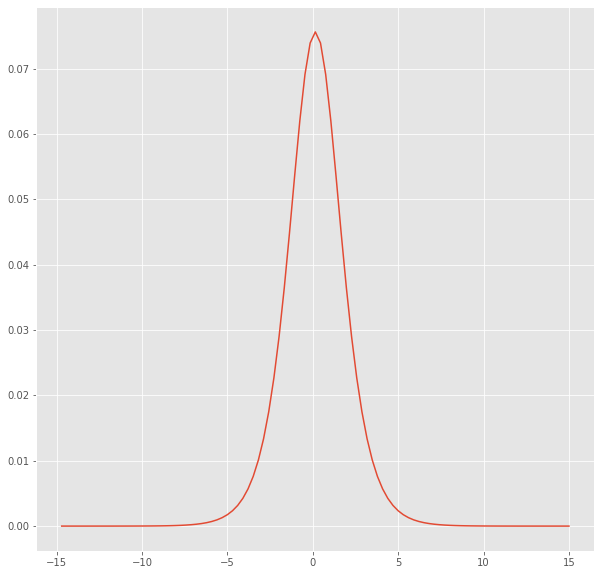

In [45]:
plt.plot(x[1:],np.diff(sp.expit(x)))

In [46]:
medians_levels = pd.concat([P_median,Q_median],axis=1)
medians_s = pd.concat([G_median,S_median],axis=1)

In [47]:
medians_levels.index = data.index
medians_levels.columns = ['Pm','Qm']
medians_s.index = data.xs(1,level=1).index
medians_s.columns = ['Gm','Sm']

In [48]:
new_l = gpd.GeoDataFrame(pd.concat([medians_levels,data_dd],axis=1))
new_s = gpd.GeoDataFrame(pd.concat([medians_s,data_dd.xs(1,level=1)],axis=1))

In [53]:
%time taxa_df = list(map(lambda i : data.xs(i,level=1)[data.Y.xs(i,level=1) > 0],range(1,7) ))
%time taxa_results = list(map(lambda i : new_l.xs(i,level=1),range(1,7))) 

CPU times: user 170 ms, sys: 32 µs, total: 170 ms
Wall time: 169 ms
CPU times: user 74.6 ms, sys: 0 ns, total: 74.6 ms
Wall time: 74.5 ms


In [54]:
tnames = list(data_dd['taxon'].xs(238478))

In [56]:


i = 0
group_name = tnames[i]
label_p = "Ecological Suitability for "
label_q = "Mixed latent Q(x) for "

complement_df = taxa_df[5]
presences_df = taxa_df[i]
#pines_pt = gTDF[gTDF.Abies > 0]
#complement_pt = taxa_df[1]


#### Change accordingly

width = 600
height = 650

sample_pt = gv.Points((complement_df.Longitude,complement_df.Latitude),group=group_name,label='Sample').opts(
            fill_color = 'red',
            line_color = 'grey',
            line_width = 0.2,
            line_alpha = 0.9,
            fill_alpha = 0.6,
            size = 2,
            )

presence_pt = gv.Points((presences_df.Longitude,presences_df.Latitude),group=group_name,label='Presence').opts(
           marker = 'x',
          color = 'black')

obs = (sample_pt * presence_pt)
cmap = plt.cm.viridis
#cmap = plt.cm.seismic


P = gv.Polygons(taxa_results[i],vdims=['Pm','Qm'],group=group_name,label="Ecological Suitability P(x)")
Q = gv.Polygons(taxa_results[i],vdims=['Qm','Pm'],group=group_name,label="Mixing effect Q(x)")



latent_pres_fig = ((P * obs).relabel(label_p) + (Q * obs).relabel(label_q))
#latent_pres_fig = ((P).relabel(lm) + (Q ).relabel(lm))

#clim = (-4,4)
#clim = (0,1)
latent_pres_fig.opts(
    opts.Polygons(
        line_width=0.001,
        line_alpha = 0.2,
        tools=['hover'],
        width = width,
        height = height,
        colorbar = True,
        #clim = clim,        
        colorbar_position = 'bottom',
        alpha = 1.0,
        cmap = cmap,),
    #merge_tools=False
)




:Layout
   .Leucaena.Ecological_Suitability_for                              :Overlay
      .Leucaena.Ecological_Suitability_P_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Pm,Qm)
      .Leucaena.Sample                                                        :Points   [x,y]
      .Leucaena.Presence                                                      :Points   [x,y]
   .Leucaena.Mixed_latent_Q_left_parenthesis_x_right_parenthesis_for :Overlay
      .Leucaena.Mixing_effect_Q_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Qm,Pm)
      .Leucaena.Sample                                               :Points   [x,y]
      .Leucaena.Presence                                             :Points   [x,y]

In [57]:
i = 1
group_name = tnames[i]
label_p = "Ecological Suitability for "
label_q = "Mixed latent Q(x) for "

complement_df = taxa_df[5]
presences_df = taxa_df[i]
#pines_pt = gTDF[gTDF.Abies > 0]
#complement_pt = taxa_df[1]


#### Change accordingly

width = 600
height = 650

sample_pt = gv.Points((complement_df.Longitude,complement_df.Latitude),group=group_name,label='Sample').opts(
            fill_color = 'red',
            line_color = 'grey',
            line_width = 0.2,
            line_alpha = 0.9,
            fill_alpha = 0.6,
            size = 2,
            )

presence_pt = gv.Points((presences_df.Longitude,presences_df.Latitude),group=group_name,label='Presence').opts(
           marker = 'x',
          color = 'black')

obs = (sample_pt * presence_pt)
cmap = plt.cm.viridis



P = gv.Polygons(taxa_results[i],vdims=['Pm','Qm'],group=group_name,label="Ecological Suitability P(x)")
Q = gv.Polygons(taxa_results[i],vdims=['Qm','Pm'],group=group_name,label="Mixing effect Q(x)")



latent_pres_fig = ((P * obs).relabel(label_p) + (Q * obs).relabel(label_q))
#latent_pres_fig = ((P).relabel(lm) + (Q ).relabel(lm))

#clim = (-4,4)

latent_pres_fig.opts(
    opts.Polygons(
        line_width=0.001,
        line_alpha = 0.2,
        tools=['hover'],
        width = width,
        height = height,
        colorbar = True,
        #clim = clim,        
        colorbar_position = 'bottom',
        alpha = 1.0,
        cmap = cmap,),
    #merge_tools=False
)


:Layout
   .Phyllostomidae.Ecological_Suitability_for                              :Overlay
      .Phyllostomidae.Ecological_Suitability_P_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Pm,Qm)
      .Phyllostomidae.Sample                                                        :Points   [x,y]
      .Phyllostomidae.Presence                                                      :Points   [x,y]
   .Phyllostomidae.Mixed_latent_Q_left_parenthesis_x_right_parenthesis_for :Overlay
      .Phyllostomidae.Mixing_effect_Q_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Qm,Pm)
      .Phyllostomidae.Sample                                               :Points   [x,y]
      .Phyllostomidae.Presence                                             :Points   [x,y]

In [58]:
i = 2
group_name = tnames[i]
label_p = "Ecological Suitability for "
label_q = "Mixed latent Q(x) for "

complement_df = taxa_df[5]
presences_df = taxa_df[i]
#pines_pt = gTDF[gTDF.Abies > 0]
#complement_pt = taxa_df[1]


#### Change accordingly

width = 600
height = 650

sample_pt = gv.Points((complement_df.Longitude,complement_df.Latitude),group=group_name,label='Sample').opts(
            fill_color = 'red',
            line_color = 'grey',
            line_width = 0.2,
            line_alpha = 0.9,
            fill_alpha = 0.6,
            size = 2,
            )

presence_pt = gv.Points((presences_df.Longitude,presences_df.Latitude),group=group_name,label='Presence').opts(
           marker = 'x',
          color = 'black')

obs = (sample_pt * presence_pt)
cmap = plt.cm.viridis



P = gv.Polygons(taxa_results[i],vdims=['Pm','Qm'],group=group_name,label="Ecological Suitability P(x)")
Q = gv.Polygons(taxa_results[i],vdims=['Qm','Pm'],group=group_name,label="Mixing effect Q(x)")



latent_pres_fig = ((P * obs).relabel(label_p) + (Q * obs).relabel(label_q))
#latent_pres_fig = ((P).relabel(lm) + (Q ).relabel(lm))

#clim = (-4,4)

latent_pres_fig.opts(
    opts.Polygons(
        line_width=0.001,
        line_alpha = 0.2,
        tools=['hover'],
        width = width,
        height = height,
        colorbar = True,
        #clim = clim,        
        colorbar_position = 'bottom',
        alpha = 1.0,
        cmap = cmap,),
    #merge_tools=False
)


:Layout
   .Picidae.Ecological_Suitability_for                              :Overlay
      .Picidae.Ecological_Suitability_P_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Pm,Qm)
      .Picidae.Sample                                                        :Points   [x,y]
      .Picidae.Presence                                                      :Points   [x,y]
   .Picidae.Mixed_latent_Q_left_parenthesis_x_right_parenthesis_for :Overlay
      .Picidae.Mixing_effect_Q_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Qm,Pm)
      .Picidae.Sample                                               :Points   [x,y]
      .Picidae.Presence                                             :Points   [x,y]

In [59]:
i = 3
group_name = tnames[i]
label_p = "Ecological Suitability for "
label_q = "Mixed latent Q(x) for "

complement_df = taxa_df[5]
presences_df = taxa_df[i]
#pines_pt = gTDF[gTDF.Abies > 0]
#complement_pt = taxa_df[1]


#### Change accordingly

width = 600
height = 650

sample_pt = gv.Points((complement_df.Longitude,complement_df.Latitude),group=group_name,label='Sample').opts(
            fill_color = 'red',
            line_color = 'grey',
            line_width = 0.2,
            line_alpha = 0.9,
            fill_alpha = 0.6,
            size = 2,
            )

presence_pt = gv.Points((presences_df.Longitude,presences_df.Latitude),group=group_name,label='Presence').opts(
           marker = 'x',
          color = 'black')

obs = (sample_pt * presence_pt)
cmap = plt.cm.viridis



P = gv.Polygons(taxa_results[i],vdims=['Pm','Qm'],group=group_name,label="Ecological Suitability P(x)")
Q = gv.Polygons(taxa_results[i],vdims=['Qm','Pm'],group=group_name,label="Mixing effect Q(x)")



latent_pres_fig = ((P * obs).relabel(label_p) + (Q * obs).relabel(label_q))
#latent_pres_fig = ((P).relabel(lm) + (Q ).relabel(lm))

#clim = (-4,4)

latent_pres_fig.opts(
    opts.Polygons(
        line_width=0.001,
        line_alpha = 0.2,
        tools=['hover'],
        width = width,
        height = height,
        colorbar = True,
        #clim = clim,        
        colorbar_position = 'bottom',
        alpha = 1.0,
        cmap = cmap,),
    #merge_tools=False
)


:Layout
   .Quercus.Ecological_Suitability_for                              :Overlay
      .Quercus.Ecological_Suitability_P_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Pm,Qm)
      .Quercus.Sample                                                        :Points   [x,y]
      .Quercus.Presence                                                      :Points   [x,y]
   .Quercus.Mixed_latent_Q_left_parenthesis_x_right_parenthesis_for :Overlay
      .Quercus.Mixing_effect_Q_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Qm,Pm)
      .Quercus.Sample                                               :Points   [x,y]
      .Quercus.Presence                                             :Points   [x,y]

In [60]:
i = 4
group_name = tnames[i]
label_p = "Ecological Suitability for "
label_q = "Mixed latent Q(x) for "

complement_df = taxa_df[5]
presences_df = taxa_df[i]
#pines_pt = gTDF[gTDF.Abies > 0]
#complement_pt = taxa_df[1]


#### Change accordingly

width = 600
height = 650

sample_pt = gv.Points((complement_df.Longitude,complement_df.Latitude),group=group_name,label='Sample').opts(
            fill_color = 'red',
            line_color = 'grey',
            line_width = 0.2,
            line_alpha = 0.9,
            fill_alpha = 0.6,
            size = 2,
            )

presence_pt = gv.Points((presences_df.Longitude,presences_df.Latitude),group=group_name,label='Presence').opts(
           marker = 'x',
          color = 'black')

obs = (sample_pt * presence_pt)
cmap = plt.cm.viridis
#cmap = plt.cm.RdBu
#cmap = plt.cm.Blues

P = gv.Polygons(taxa_results[i],vdims=['Pm','Qm'],group=group_name,label="Ecological Suitability P(x)")
Q = gv.Polygons(taxa_results[i],vdims=['Qm','Pm'],group=group_name,label="Mixing effect Q(x)")



latent_pres_fig = ((P * obs).relabel(label_p) + (Q * obs).relabel(label_q))
#latent_pres_fig = ((P).relabel(lm) + (Q ).relabel(lm))

#clim = (-4,4)
clim = (0,1)

latent_pres_fig.opts(
    opts.Polygons(
        line_width=0.001,
        line_alpha = 0.2,
        tools=['hover'],
        width = width,
        height = height,
        colorbar = True,
        #clim = clim,        
        colorbar_position = 'bottom',
        alpha = 1.0,
        cmap = cmap,),
    #merge_tools=False
)


:Layout
   .Pinaceae.Ecological_Suitability_for                              :Overlay
      .Pinaceae.Ecological_Suitability_P_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Pm,Qm)
      .Pinaceae.Sample                                                        :Points   [x,y]
      .Pinaceae.Presence                                                      :Points   [x,y]
   .Pinaceae.Mixed_latent_Q_left_parenthesis_x_right_parenthesis_for :Overlay
      .Pinaceae.Mixing_effect_Q_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Qm,Pm)
      .Pinaceae.Sample                                               :Points   [x,y]
      .Pinaceae.Presence                                             :Points   [x,y]

In [61]:
i = 5
group_name = tnames[i]
label_p = "Ecological Suitability for "
label_q = "Mixed latent Q(x) for "

complement_df = taxa_df[5]
presences_df = taxa_df[i]
#pines_pt = gTDF[gTDF.Abies > 0]
#complement_pt = taxa_df[1]


#### Change accordingly

width = 600
height = 650

sample_pt = gv.Points((complement_df.Longitude,complement_df.Latitude),group=group_name,label='Sample').opts(
            fill_color = 'red',
            line_color = 'grey',
            line_width = 0.2,
            line_alpha = 0.9,
            fill_alpha = 0.6,
            size = 2,
            )

presence_pt = gv.Points((presences_df.Longitude,presences_df.Latitude),group=group_name,label='Presence').opts(
           marker = 'x',
          color = 'black')

obs = (sample_pt * presence_pt)

cmap = plt.cm.viridis
#cmap = plt.cm.RdBu


P = gv.Polygons(taxa_results[i],vdims=['Pm','Qm'],group=group_name,label="Ecological Suitability P(x)")
Q = gv.Polygons(taxa_results[i],vdims=['Qm','Pm'],group=group_name,label="Mixing effect Q(x)")



latent_pres_fig = ((P * obs).relabel(label_p) + (Q * obs).relabel(label_q))
#latent_pres_fig = ((P).relabel(lm) + (Q ).relabel(lm))

clim = (0,1)

latent_pres_fig.opts(
    opts.Polygons(
        line_width=0.001,
        line_alpha = 0.2,
        tools=['hover'],
        width = width,
        height = height,
        colorbar = True,
        clim = clim,        
        colorbar_position = 'bottom',
        alpha = 1.0,
        cmap = cmap,),
    #merge_tools=False
)


:Layout
   .Complement.Ecological_Suitability_for                              :Overlay
      .Complement.Ecological_Suitability_P_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Pm,Qm)
      .Complement.Sample                                                        :Points   [x,y]
      .Complement.Presence                                                      :Points   [x,y]
   .Complement.Mixed_latent_Q_left_parenthesis_x_right_parenthesis_for :Overlay
      .Complement.Mixing_effect_Q_left_parenthesis_x_right_parenthesis :Polygons   [Longitude,Latitude]   (Qm,Pm)
      .Complement.Sample                                               :Points   [x,y]
      .Complement.Presence                                             :Points   [x,y]

## Saving the model, its posterior sample
Depending on the model, generating a convergent posterior sample could take several hours. In this case, it is recommended to save the model for later use. To do this, we can pickle the 'fit3' object and save it to disk. Afterwards, we can load this pickled object for later analysis, plotting and generating further samples. 

It is recommended to use the same machine for generating the posterior sample (and compiled model) and for loading the pickled object. If the model is compiled in a computer with a different architecture (and operative system) that the one intending to load the pickled object, the unpickling function will fail.

In [ ]:
import pickle
_file = "data/multispecies_model-changename.pkl"
with open(_file,"wb") as f:
    # see that multispecies_model is the object model
    %time pickle.dump([multispecies_model,fit3],f,protocol=-1)


## Load the pickled object


In [88]:
with open(_file, "rb") as f:
    data_list = pickle.load(f)
fit = data_dict['fit']
# fit = data_list[1]

/opt/conda/envs/biospytial/lib/python2.7/site-packages/pandas/core/indexes/base.py:162: FutureWarning: the 'labels' keyword is deprecated, use 'codes' instead
  return cls.__new__(cls, **d)


## Load the summary statistics

In [90]:
print(fit.stansummary(pars='beta'))
print(fit.stansummary(pars='alpha'))
print(fit.stansummary(pars='alpha_car'))
print(fit.stansummary(pars='tau'))

Inference for Stan model: anon_model_c886f98cb6e47ecc6d69746055875c04.
5 chains, each with iter=10; warmup=5; thin=1; 
post-warmup draws per chain=5, total post-warmup draws=25.

            mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[1,1]   0.22     nan   1.26   -1.0  -0.78  -0.55   1.61   1.83    nan    inf
beta[2,1]   0.58     nan    1.1  -0.84  -0.11   0.17   1.68   1.98    nan    inf
beta[3,1]   0.59     nan    1.2  -1.18  -0.38   1.11   1.52   1.88    nan    inf
beta[4,1]   0.14     nan   0.85  -0.54  -0.49   -0.2   0.23   1.71    nan    inf
beta[5,1]  -0.91     nan   1.06  -1.92   -1.9  -1.16  -0.44   0.86    nan    inf
beta[6,1]   0.88     nan    1.1  -0.93   0.48   0.93   1.95   1.99    nan    inf
beta[1,2]  -0.63     nan   0.93  -1.73  -1.47  -0.72   0.03   0.73    nan    inf
beta[2,2]  -0.26     nan   1.19  -1.61  -1.21  -0.67   0.82   1.38    nan    inf
beta[3,2]   0.24     nan    1.0  -1.19  -0.02   0.01   0.57   1.84    nan    inf
beta[4,2]  